In [1]:
!pip install mtcnn

     |████████████████████████████████| 2.3MB 6.0MB/s 


Na początek sprawdzam czy jupyter poprawnie wyświetla obrazy

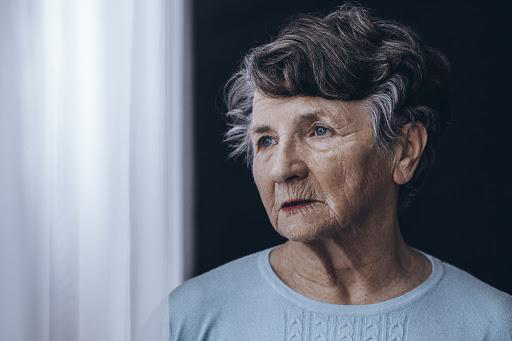

In [2]:
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# check if PIL is working
pil_im = Image.open('dataset/img/01F6ZE7VE6BXETY5PR2KK38NXZ.jpeg')
display(pil_im)

Importuję potrzebne biblioteki i funkcje z pliku utils. Biblioteka mtcnn odpowiada za uruchomienie i działałanie sieci neuronowej.

In [3]:
from utils import intersection_over_union, process_json
from mtcnn import MTCNN
import numpy as np
import os
import warnings

warnings.filterwarnings('ignore')

Następnie definiuję funkcję dokonującą detekcji twarzy. Na początek tworzy ona folder wyściowy. Następnie obraz jest wczytywany i przekazywany do sieci, która tworzy predykcję z której wyciągam 'box'. Pozostała część funkcji służy do rysowania predykcji i ground truth na orginalnym obrazie. Obraz następnie jest wyświetlany lub zapisywany w folderze wynikowym w zależności od parametru save_images.

In [6]:

def detect_faces(detector, images, save_images=True, input_folder='dataset', output_folder='result'):
    """ Detect faces on images im dataset folder
    :param detector:
    :param images: dictionary created with process_json
    :param save_images: Save images with true and predicted boxes to result directory
    :param input_folder: Directory with images
    :param output_folder: Output directory

    :return: list with IoU statistic for each image
    """

    ious = []
    if not os.path.isdir(output_folder):
        os.mkdir(output_folder)
        os.mkdir(os.path.join(output_folder, 'img'))
    for image in images.keys():

        # Load an image with an unknown face
        pil_image = Image.open(os.path.join(input_folder, image))
        array_image = np.array(pil_image)

        # Find all the faces and face encodings in the unknown image
        result = detector.detect_faces(array_image)
        if result:
            face_locations = result[0]['box']
        else:
            # If face was not detected I create fake box at 0 coordinates
            face_locations = (0, 0, 0, 0)

        # Create a Pillow ImageDraw Draw instance to draw with
        draw = ImageDraw.Draw(pil_image)

        # Loop through each face found in the unknown image
        x1, y1, width, height = face_locations
        rectangle_hat = ((x1, y1), (x1 + width, y1 + height))
        rectangle_true = images[image]

        iou = intersection_over_union(rectangle_true, rectangle_hat)
        ious.append(iou)

        # Draw a box around the face using the Pillow module
        draw.rectangle(rectangle_hat, outline=(0, 0, 255))
        draw.rectangle(rectangle_true, outline=(0, 255, 0))

        draw.text((0, 0), f"IoU: {round(iou, 4)}", (255, 255, 255))

        if save_images:
            pil_image.save(os.path.join(output_folder, image))
        else:
          display(pil_image)

    return ious

Ostatecznie, tworzę objekt analizowanej sieci neuronowej, przetwarzam plik json w którym zawarte są ścieżki do plików oraz punkty wskazujące położenie twarzy na obrazie. Ostatnia linia dokonuje predykcji i zapisuje wartości IoU w liście ious.

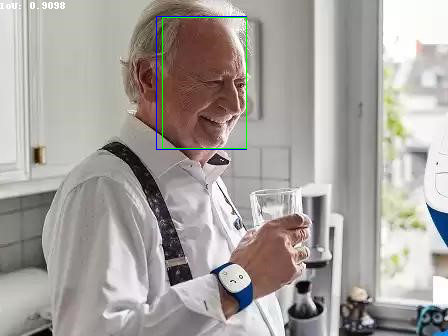

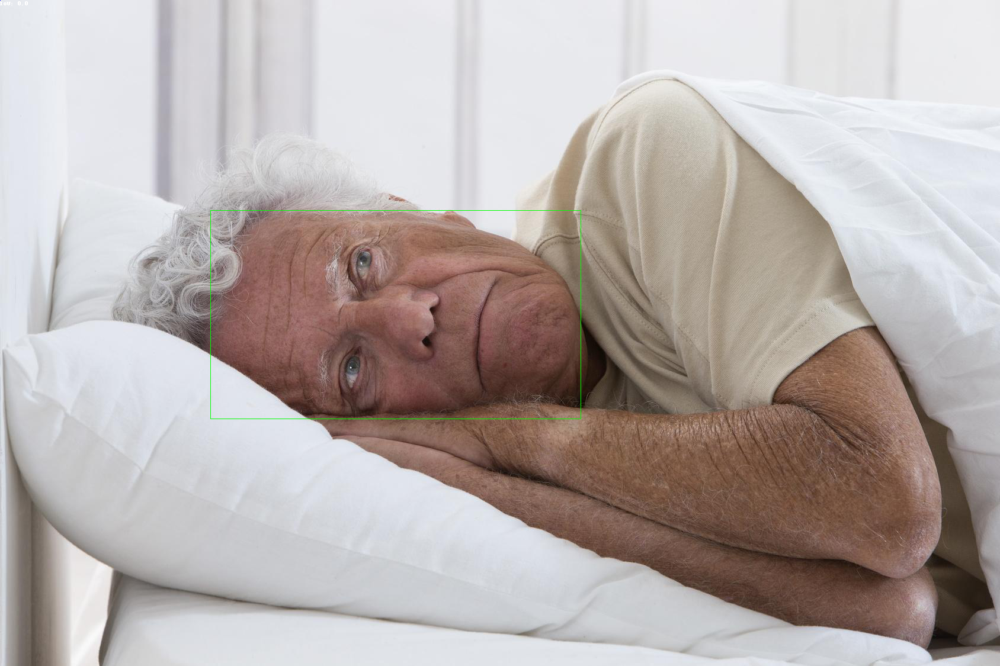

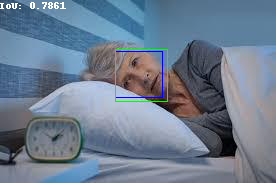

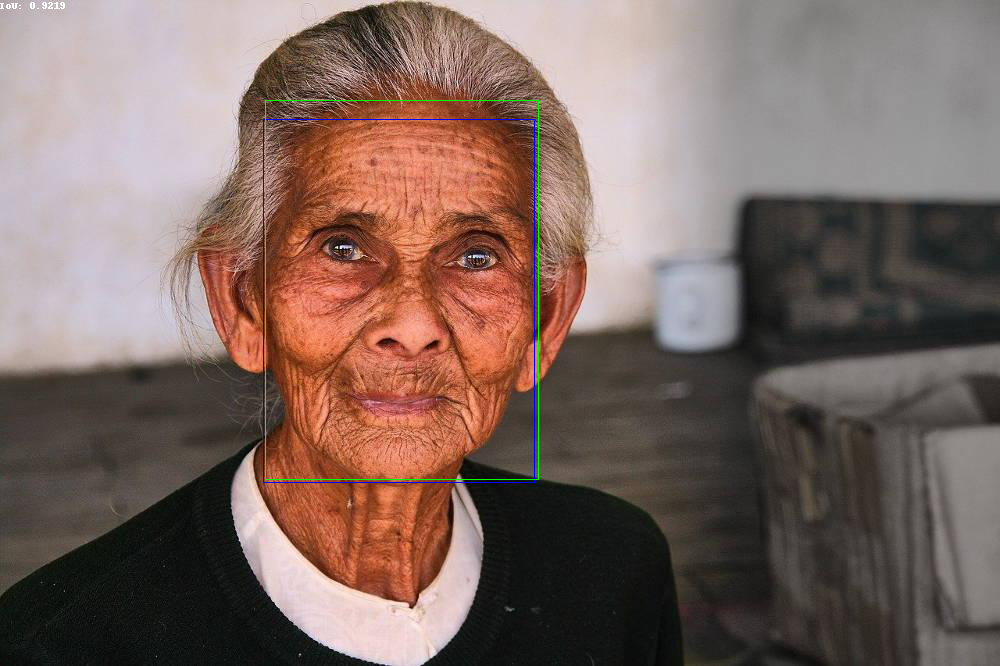

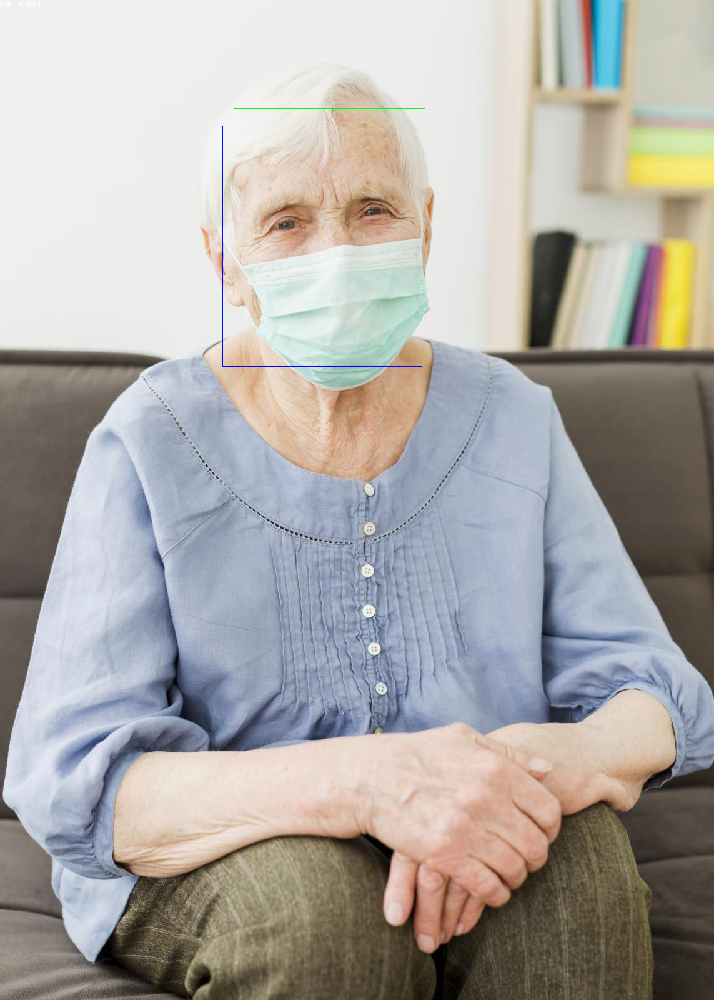

...

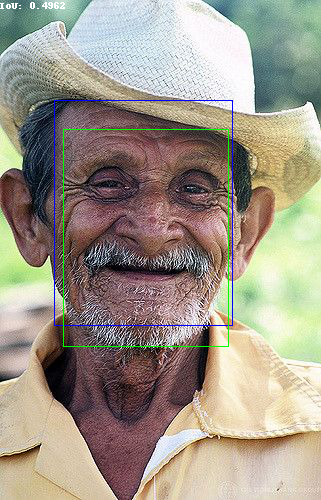

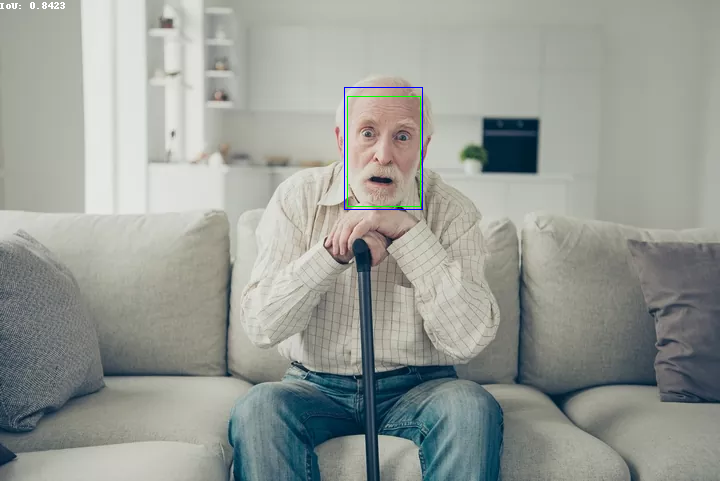

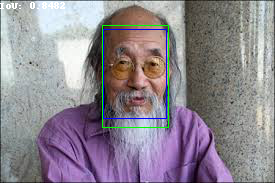

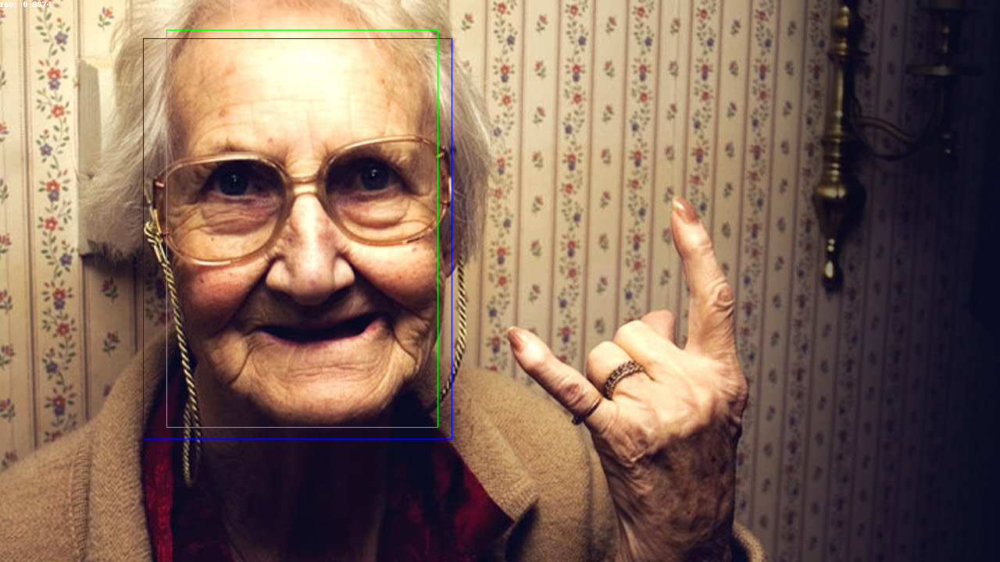

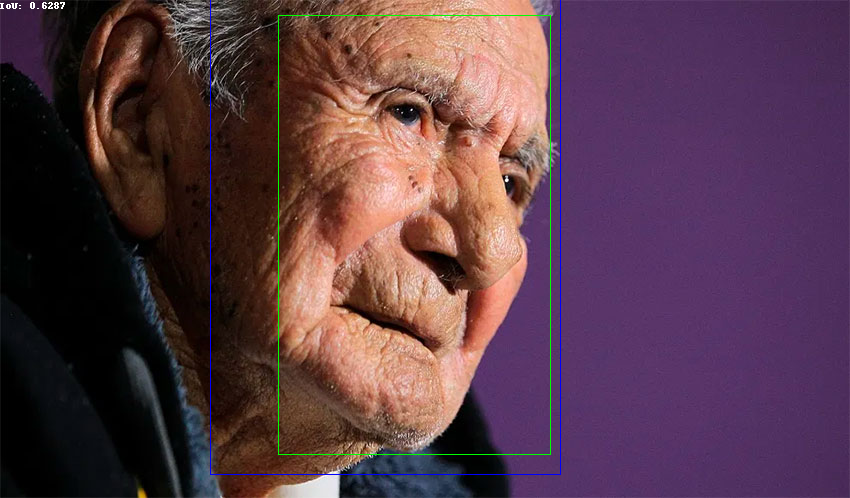

Average IoU is: 0.806


In [7]:
    detector = MTCNN()
    images = process_json('dataset/labels.json')
    ious = detect_faces(detector, images, save_images=False)

    

Jak pokazują powyższe obrazy model poradził sobie dobrze z detekcją twarzy. Nie wykrył jej tylko w jednym przypadku na 25. Poniżej zamieszczam jeszcze średnią wartość IoU dla wszystkich obrazów.

In [8]:
print(f'Average IoU is: {np.mean(ious).round(3)}')

Average IoU is: 0.806
